In [1]:
import pathlib

import numpy as np
import torch
from PIL import Image, ImageOps
from transformers import (
    VisionEncoderDecoderModel,
    TrOCRProcessor
)
from ultralytics import YOLO

In [2]:
def seed_everything(seed_value):
    np.random.seed(seed_value)
    torch.manual_seed(seed_value)
    torch.cuda.manual_seed_all(seed_value)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(42)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [3]:
class TextRecognizePipeline:
    
    def __init__(self, detection_model_path: str, ocr_model_dir_path: str):
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.ocr_processor = TrOCRProcessor.from_pretrained("raxtemur/trocr-base-ru")
        self.ocr_model = VisionEncoderDecoderModel.from_pretrained(ocr_model_dir_path, local_files_only=True).to(self.device)
        self.detection_model = YOLO(detection_model_path).to(self.device)
        
        # Set special tokens used for creating the decoder_input_ids from the labels.
        self.ocr_model.config.decoder_start_token_id = self.ocr_processor.tokenizer.cls_token_id
        self.ocr_model.config.pad_token_id = self.ocr_processor.tokenizer.pad_token_id
        # Set Correct vocab size.
        self.ocr_model.config.vocab_size = self.ocr_model.config.decoder.vocab_size
        self.ocr_model.config.eos_token_id = self.ocr_processor.tokenizer.sep_token_id
        
        self.ocr_model.config.max_length = 64
        self.ocr_model.config.early_stopping = True
        self.ocr_model.config.no_repeat_ngram_size = 3
        self.ocr_model.config.length_penalty = 2.0
        self.ocr_model.config.num_beams = 4
    
    def detect_text_and_crop_images(self, img: Image) -> list[Image]:
        
        def sort_bbox_by_y(bbox_list):
            sorted_bbox = sorted(bbox_list, key=lambda bbox: (bbox[1], bbox[0]))  # Сортировка по координате y, затем по x
            return sorted_bbox
        
        result = []
        for predict, image in zip(self.detection_model.predict([img]), [img]):
            bboxes = predict.boxes.xyxy.cpu().tolist()
            sorted_bboxes = sort_bbox_by_y(bboxes)
            for box in sorted_bboxes:
                cropped_image = image.crop(box)
                result.append(cropped_image)
        return result
    
    def get_ocr_predictions(self, img_list: list[Image]) -> list[str]:
        pixel_values = self.ocr_processor(img_list, return_tensors="pt").pixel_values.to(device)
        generated_ids = self.ocr_model.generate(pixel_values)
        generated_text = self.ocr_processor.batch_decode(generated_ids, skip_special_tokens=True)
        return generated_text
    
    def recognize(self, img_list: list[Image]) -> list[str]:
        cropped_images = self.detect_text_and_crop_images(img_list)
        recognized_text = self.get_ocr_predictions(cropped_images)
        return recognized_text

In [4]:
def get_rand_image():
    path = pathlib.Path("../../data/processed/3 Production/text_detector/test/images")
    img_path = np.random.choice(list(path.iterdir()))
    img = Image.open(img_path)
    img = ImageOps.exif_transpose(img)
    return img, img_path

Инициализируем пайплайн

In [6]:
detection_model_path = "../../models/new_text_detector/best_1024.pt"
ocr_model_dir_path = "../../models/text_recognizer/trocr_ru_pretrain_3epoch/"

ocr_pipeline = TextRecognizePipeline(
    detection_model_path=detection_model_path,
    ocr_model_dir_path=ocr_model_dir_path
)

Получаем и отображаем случайное изображение из директории


In [7]:
img, img_path = get_rand_image()
img.show()

Error: no "view" rule for type "image/png" passed its test case
       (for more information, add "--debug=1" on the command line)


Из пайплайна можем получить список задетектированных строк и отобразить их

In [8]:
cropped_images = ocr_pipeline.detect_text_and_crop_images(img)


0: 1024x768 19 texts, 62.5ms
Speed: 6.1ms preprocess, 62.5ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 768)


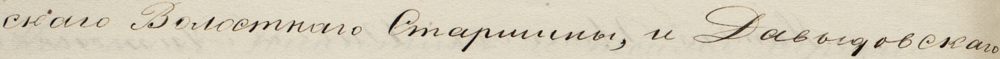

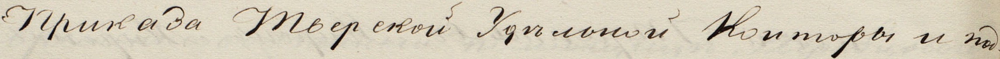

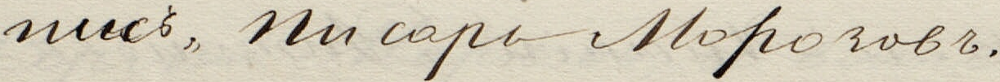

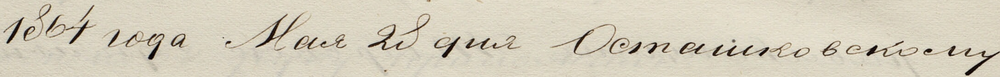

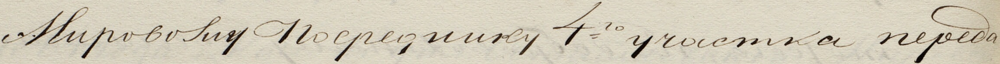

...

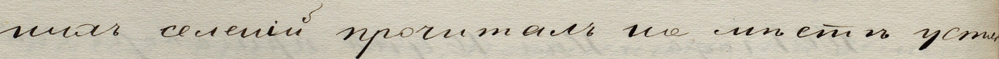

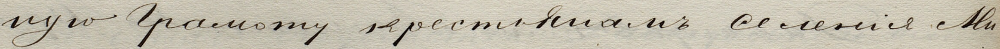

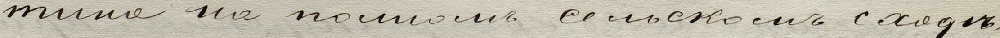

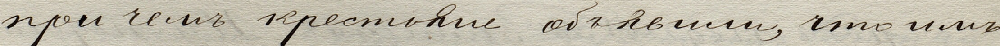

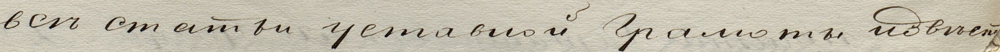

In [9]:
for cropped_image in cropped_images:
    display(cropped_image)

Получаем распознанный текст с изображения

In [10]:
recognized_text = ocr_pipeline.recognize(img)


0: 1024x768 19 texts, 14.6ms
Speed: 2.8ms preprocess, 14.6ms inference, 0.7ms postprocess per image at shape (1, 3, 1024, 768)


In [11]:
recognized_text

['скаго Волостнапо Старшины, и Давыдовского',
 'Приказа Тверской Удельной, Конторы и по',
 'пись, Писарь Морозовъ.',
 '1864 года Мая 28 дня Осташковскому',
 'Мировому Посреднику 4го участка перепа',
 'на Гни Управляющимъ Тверскою Удельно',
 'Конторою Уставная Грамота о крнахъ',
 'поселенныхъ на земле Удельнаго ведом',
 'ства селенiе Митино составлевшая по',
 'добровольному соглашенiю съ крестьянами',
 'оказаннаго селенiя и подписани кресть',
 'янами. Вследствiе чего Мировой Посред',
 'никъ при нижепоименованныхъ, по сторон',
 'нихъ добросовъстных крестьянах сосед',
 'нихъ селенiй прочиталъ на месте уста',
 'ную грамоту крестьянамъ селенiя Ми',
 'тина на полномъ сельском сходе,',
 'причемъ крестьяне объявили, что име',
 'все Статьи уставной грамоты извест']